In [1]:
import pystac
import pystac_client
import stackstac
import numpy as np
import pandas as pd
import geopandas as gpd
import hvplot.xarray
from dask.distributed import Client
import rioxarray
import os
import matplotlib.pyplot as plt
import ulmo
from datetime import datetime
import xarray as xr

In [2]:
# MODIFY PARAMETERS

#-------------------------------------------------------------------------
# comment ONE of these out at a time
relative_orbit_number = 137 # change to get any particular relative orbit
#orbit_direction = 'ascending' # 'ascending', descending', 'all'
#-------------------------------------------------------------------------
# define time slice
today = datetime.today().strftime('%Y-%m-%d')
#time_slice = slice('2019-10-01','2020-09-30') # All of 2020 water year
time_slice = slice('2020-01-01','2020-12-31') # All of 2020

#time_slice = slice('2017-01-01',today)
#-------------------------------------------------------------------------
polarization ='gamma0_vv'
#-------------------------------------------------------------------------
bounding_box_gf = gpd.read_file('shapefiles/mt_rainier.geojson')
#-------------------------------------------------------------------------
rainier_glaciers = gpd.read_file('shapefiles/rainier_glaciers.geojson')
#-------------------------------------------------------------------------
sitecode = 'SNOTEL:679_WA_SNTL'
#variablecode_p = 'SNOTEL:TAVG_D'
#variablecode_p = 'SNOTEL:PRCPSA_D'
variablecode1 = 'SNOTEL:WTEQ_D'
variablecode2 = 'SNOTEL:SNWD_D'
# snow depth
# swe pillow better reading than ultrasonic
#-------------------------------------------------------------------------
cloud_cover_threshold = 20
#resample_freq_s1 = "W" # https://towardsdatascience.com/resample-function-of-pandas-79b17ec82a78
resample_freq_s2 = "2W"
#resample_freq = "MS"
shapefile_clip = True

In [3]:
plt.style.use('seaborn-poster')


In [4]:
if 'relative_orbit_number' in locals():
    by_orbit = True
else: 
    by_orbit = False

In [5]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 

In [6]:
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:8787/status,
Dashboard: http://172.25.45.79:8787/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/549098/1,Workers: 1
Dashboard: http://172.25.45.79:8787/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/549098/4,Total threads: 32
Dashboard: http://172.25.45.79:40081/status,Memory: 125.71 GiB
Nanny: None,


In [7]:
xr.set_options(keep_attrs=True)

In [8]:
# Load STAC ItemCollection
stac_items = pystac.ItemCollection.from_file('mycollection.json')
items = [item.to_dict(transform_hrefs=False) for item in stac_items]

stack = stackstac.stack(items,
                        dtype='float32')
stack

,Array,Chunk
Bytes,128.67 GiB,4.00 MiB
Shape,"(382, 3, 5490, 5490)","(1, 1, 1024, 1024)"
Count,43584 Tasks,41256 Chunks
Type,float32,numpy.ndarray


In [9]:
# import bounding box
bounding_box_utm_gf = bounding_box_gf.to_crs(stack.crs)
xmin, ymax, xmax, ymin = bounding_box_utm_gf.bounds.values[0]

In [10]:
# filter scenes
scenes = stack.sel(band=polarization).sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice)

In [11]:
# filter by orbit direction or orbit number
if by_orbit:
    scenes = scenes.where(scenes.coords['sat:relative_orbit']==relative_orbit_number,drop=True)
    orbit_directions = scenes.coords['sat:orbit_state']
    orbit_direction = orbit_directions[0].values
elif orbit_direction == 'all':
    scenes = scenes
else:
    scenes = scenes.where(scenes.coords['sat:orbit_state']==orbit_direction,drop=True)

In [12]:
scenes

<xarray.DataArray 'stackstac-95760c591cba9956c66157c7ac882381' (time: 30, y: 861, x: 889)>
dask.array<where, shape=(30, 861, 889), dtype=float32, chunksize=(1, 861, 829), chunktype=numpy.ndarray>
Coordinates:
  * time                         (time) datetime64[ns] 2020-01-11T02:01:19 .....
    id                           (time) <U22 'S1B_20200111_10TES_ASC' ... 'S1...
    band                         <U9 'gamma0_vv'
  * x                            (x) float64 5.858e+05 5.858e+05 ... 6.036e+05
  * y                            (y) float64 5.2e+06 5.2e+06 ... 5.183e+06
    sentinel:product_ids         (time) object ['S1B_IW_GRDH_1SDV_20200111T02...
    sar:frequency_band           <U1 'C'
    gsd                          int64 20
    constellation                <U10 'sentinel-1'
    sar:center_frequency         float64 5.405
    platform                     (time) <U11 'sentinel-1b' ... 'sentinel-1b'
    sar:instrument_mode          <U2 'IW'
    sar:pixel_spacing_azimuth    int64 10
    sat:absolute_orbit           (time) int64 19763 19938 20113 ... 24663 24838
    created                      (time) <U27 '2021-11-29T19:17:40.149225Z' .....
    proj:transform               object {0.0, 1.0, -20.0, 499980.0, 5200020.0...
    sar:looks_equivalent_number  float64 4.3
    sat:relative_orbit           (time) int64 137 137 137 137 ... 137 137 137
    mgrs:grid_square             <U2 'ES'
    sar:observation_direction    <U5 'right'
    sar:resolution_range         float64 20.3
    sar:looks_azimuth            int64 1
    instruments                  <U5 'c-sar'
    start_datetime               (time) <U20 '2020-01-11T02:00:55Z' ... '2020...
    mgrs:utm_zone                <U2 '10'
    mgrs:latitude_band           <U1 'T'
    sar:polarizations            object {'VV', 'VH'}
    sentinel:mgrs                <U5 '10TES'
    proj:shape                   object {5490}
    sat:orbit_state              (time) <U10 'ascending' ... 'ascending'
    sar:product_type             <U3 'RTC'
    end_datetime                 (time) <U20 '2020-01-11T02:01:44Z' ... '2020...
    sar:looks_range              int64 5
    proj:epsg                    int64 32610
    sar:resolution_azimuth       float64 22.6
    sar:pixel_spacing_range      int64 10
    title                        <U21 'Gamma0 VV backscatter'
    epsg                         int64 32610
Attributes:
    spec:        RasterSpec(epsg=32610, bounds=(499980.0, 5090220.0, 609780.0...
    crs:         epsg:32610
    transform:   | 20.00, 0.00, 499980.00|\n| 0.00,-20.00, 5200020.00|\n| 0.0...
    resolution:  20.0

In [13]:
# could resample at the end in order to get more pixelwise values
if 'resample_freq_s1' in locals():
    scenes = scenes.resample(time=resample_freq_s1,restore_coord_dims=True).mean("time", keep_attrs=True)
#   resampled = lowcloud.resample(time=resample_freq).mean("time", keep_attrs=True)
else:
    scenes = scenes

In [14]:
%%time
# compute frames, drop missing data
frames_all = scenes.compute()
frames = frames_all.dropna('time',how='all')

CPU times: user 2.48 s, sys: 485 ms, total: 2.96 s
Wall time: 2.42 s


In [15]:
rainier_glaciers = rainier_glaciers.to_crs(stack.crs)

In [16]:
snotel = {'679_WA_SNTL': dict(longitude=-121.75, latitude=46.78, elevation=5130), # paradise ELEVATION IN FEET************
          '941_WA_SNTL': dict(longitude=-121.95, latitude=46.93, elevation=3160), # mowich
          '1085_WA_SNTL': dict(longitude=-121.53, latitude=46.87, elevation=5240) # cayuse pass
         }
df = gpd.pd.DataFrame(snotel).T

geometries = gpd.points_from_xy(df.longitude.values, df.latitude.values)

gf = gpd.GeoDataFrame(df, geometry=geometries, crs="EPSG:4326")
snotel_utm = gf.to_crs(stack.crs)
snotel_utm

,longitude,latitude,elevation,geometry
679_WA_SNTL,-121.75,46.78,5130.0,POINT (595420.885 5181475.359)
941_WA_SNTL,-121.95,46.93,3160.0,POINT (579930.758 5197920.376)
1085_WA_SNTL,-121.53,46.87,5240.0,POINT (612027.592 5191766.767)


In [17]:
wsdlurl = 'https://hydroportal.cuahsi.org/Snotel/cuahsi_1_1.asmx?WSDL'

In [18]:
easting, northing = snotel_utm.loc['679_WA_SNTL'].geometry.coords[0]

In [19]:
ulmo.cuahsi.wof.get_site_info(wsdlurl, sitecode)['series'].keys()

dict_keys(['SNOTEL:BATT_D', 'SNOTEL:BATT_H', 'SNOTEL:PRCP_y', 'SNOTEL:PRCP_sm', 'SNOTEL:PRCP_m', 'SNOTEL:PRCP_wy', 'SNOTEL:PRCPSA_y', 'SNOTEL:PRCPSA_D', 'SNOTEL:PRCPSA_sm', 'SNOTEL:PRCPSA_m', 'SNOTEL:PRCPSA_wy', 'SNOTEL:PREC_sm', 'SNOTEL:PREC_m', 'SNOTEL:PREC_wy', 'SNOTEL:SNWD_D', 'SNOTEL:SNWD_sm', 'SNOTEL:SNWD_H', 'SNOTEL:SNWD_m', 'SNOTEL:TAVG_y', 'SNOTEL:TAVG_D', 'SNOTEL:TAVG_sm', 'SNOTEL:TAVG_m', 'SNOTEL:TAVG_wy', 'SNOTEL:TMAX_y', 'SNOTEL:TMAX_D', 'SNOTEL:TMAX_sm', 'SNOTEL:TMAX_m', 'SNOTEL:TMAX_wy', 'SNOTEL:TMIN_y', 'SNOTEL:TMIN_D', 'SNOTEL:TMIN_sm', 'SNOTEL:TMIN_m', 'SNOTEL:TMIN_wy', 'SNOTEL:TOBS_D', 'SNOTEL:TOBS_sm', 'SNOTEL:TOBS_H', 'SNOTEL:TOBS_m', 'SNOTEL:WTEQ_D', 'SNOTEL:WTEQ_sm', 'SNOTEL:WTEQ_H', 'SNOTEL:WTEQ_m'])

In [20]:
def snotel_fetch(sitecode, variablecode='SNOTEL:SNWD_D', start_date='1950-10-01', end_date=today):
    #print(sitecode, variablecode, start_date, end_date)
    values_df = None
    try:
        #Request data from the server
        site_values = ulmo.cuahsi.wof.get_values(wsdlurl, sitecode, variablecode, start=start_date, end=end_date)
        #Convert to a Pandas DataFrame   
        values_df = pd.DataFrame.from_dict(site_values['values'])
        #Parse the datetime values to Pandas Timestamp objects
        values_df['datetime'] = pd.to_datetime(values_df['datetime'], utc=True)
        #Set the DataFrame index to the Timestamps
        values_df = values_df.set_index('datetime')
        #Convert values to float and replace -9999 nodata values with NaN
        values_df['value'] = pd.to_numeric(values_df['value']).replace(-9999, np.nan)
        #Remove any records flagged with lower quality
        values_df = values_df[values_df['quality_control_level_code'] == '1']
    except:
        print("Unable to fetch %s" % variablecode)

    return values_df

In [21]:
start_date = datetime.strptime(time_slice.start, '%Y-%m-%d')
end_date = datetime.strptime(time_slice.stop, '%Y-%m-%d')

In [22]:
snotel_1_df = snotel_fetch(sitecode, variablecode1, start_date, end_date)
snotel_1_df['value'] = 2.54*snotel_1_df['value'] # inches to cm
snotel_1_df['date_time_utc'] = pd.to_datetime(snotel_1_df.date_time_utc)

In [23]:
snotel_2_df = snotel_fetch(sitecode, variablecode2, start_date, end_date)
snotel_2_df['value'] = 2.54*snotel_2_df['value'] # inches to cm
snotel_2_df['date_time_utc'] = pd.to_datetime(snotel_2_df.date_time_utc)

In [24]:
#f,ax=plt.subplots(figsize=(12,5))
#frames_nearest = frames.sel(x=easting,y=northing, method='nearest')
#frames_nearest.where(frames_nearest.coords['sat:relative_orbit']==137,drop=False).plot(x='time',label='137',ax=ax)
#frames_nearest.where(frames_nearest.coords['sat:relative_orbit']==64,drop=False).plot(x='time',label='64',ax=ax)
#ax2=ax.twinx()
#snotel_df.plot.scatter(x='date_time_utc',y='value',ax=ax2,c='r',alpha=0.2,label='SWE')
#ax.legend()
#ax.set_title('gamma0_vv Time Series at Paradise for Two Relative Orbits vs Paradise SNOTEL Data')
#ax.set_xlim([time_slice.start,time_slice.stop])

In [25]:
frames_nis = frames.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Nisqually Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False)
frames_emm = frames.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Emmons Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False) 
frames_car = frames.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Carbon Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False) 
frames_tah = frames.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Tahoma Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False) 

frames_named = frames.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False) 

Text(0.5, 1.0, '2020 Water Year Glacier Mean Backscatter and SNOTEL SWE')

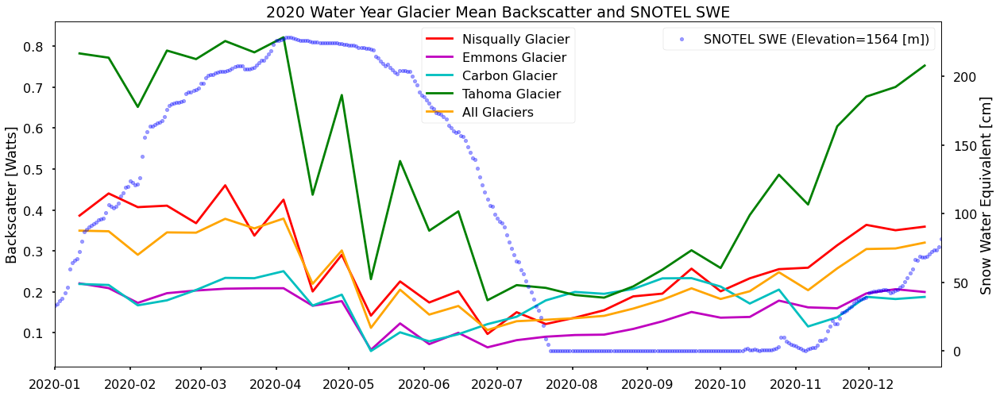

In [26]:
# look for local min for melt timings
f,ax = plt.subplots(figsize=(20,8))
plt.style.use('seaborn-poster')
#ax.plot(frames.time,frames.mean(dim=['x','y']),label='Entire Scene')
ax.plot(frames_nis.time,frames_nis.mean(dim=['x','y']),color='r',label='Nisqually Glacier')
ax.plot(frames_emm.time,frames_emm.mean(dim=['x','y']),color='m',label='Emmons Glacier')
ax.plot(frames_car.time,frames_car.mean(dim=['x','y']),color='c',label='Carbon Glacier')
ax.plot(frames_tah.time,frames_tah.mean(dim=['x','y']),color='g',label='Tahoma Glacier')
ax.plot(frames_named.time,frames_named.mean(dim=['x','y']),color='orange',label='All Glaciers')

ax2=ax.twinx()
snotel_1_df.plot.scatter(x='date_time_utc',y='value',ax=ax2,c='b',alpha=0.4,label='SNOTEL SWE (Elevation=1564 [m])')
#ax3=ax2.twinx()
#values_precip_df.plot.scatter(x='date_time_utc',y='value',ax=ax3,c='b',alpha=0.8,label='Temperature')

ax.set_xlim([time_slice.start,time_slice.stop])
ax.legend(loc='upper center')
ax2.legend(loc='upper right')
ax2.grid(False)
ax2.set_ylabel('Snow Water Equivalent [cm]')
ax.set_ylabel('Backscatter [Watts]')

ax.set_title(f'2020 Water Year Glacier Mean Backscatter and SNOTEL SWE')

In [27]:
mins_info = frames.argmin(dim='time',skipna=False)

In [28]:
lower_lon, upper_lat, upper_lon, lower_lat = bounding_box_gf.bounds.values[0]
lon = (lower_lon + upper_lon)/2
lat = (lower_lat + upper_lat)/2

In [29]:
URL = "https://earth-search.aws.element84.com/v0"
catalog = pystac_client.Client.open(URL)

In [30]:
items = catalog.search(
    intersects=dict(type="Point", coordinates=[lon, lat]),
    collections=["sentinel-s2-l2a-cogs"],
    datetime="2010-01-01/2025-01-01"
).get_all_items()

In [31]:
stack = stackstac.stack(items)
xr.set_options(keep_attrs=True)
stack

,Array,Chunk
Bytes,32.86 TiB,8.00 MiB
Shape,"(1153, 17, 20982, 10980)","(1, 1, 1024, 1024)"
Count,4567264 Tasks,4527831 Chunks
Type,float64,numpy.ndarray


In [32]:
# import bounding box
bounding_box_utm_gf = bounding_box_gf.to_crs(stack.crs)
xmin, ymax, xmax, ymin = bounding_box_utm_gf.bounds.values[0]
rainier_glaciers = rainier_glaciers.to_crs(stack.crs)

In [33]:
lowcloud = stack[stack["eo:cloud_cover"] < cloud_cover_threshold]
#stack.sel(time=time_slice) 298 images for the year
#lowcloud.sel(time=time_slice) 87 lowcloud days for the year

In [34]:
t = np.datetime64('2020-05-05T19:21:34.000000000')

In [35]:
lowcloud = lowcloud.loc[lowcloud.time !=t]

In [36]:
# could resample at the end in order to get more pixelwise values
if 'resample_freq_s2' in locals():
    lowcloud = lowcloud.resample(time=resample_freq_s2).median("time", keep_attrs=True)
#   resampled = lowcloud.resample(time=resample_freq).mean("time", keep_attrs=True)
else:
    lowcloud = lowcloud

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/xarray/core/indexing.py:1227: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/dask/array/core.py:4454: PerformanceWarning: Increasing number of chunks by factor of 17
  result = blockwise(
/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/dask/array/core.py:4454: PerformanceWarning: Increasing number of chunks by factor of 21
  result = blockwise(
/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/dask/array/core.p

In [37]:
vir, swir = lowcloud.sel(band="B03"), lowcloud.sel(band="B11")
ndsi = (vir-swir)/(vir+swir)

In [38]:
scenes_ndsi = ndsi.sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice)

In [39]:
%%time
frames_ndsi_all = scenes_ndsi.compute()
frames_ndsi = frames_ndsi_all.dropna('time',how='all')

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


CPU times: user 3min 32s, sys: 24.9 s, total: 3min 57s
Wall time: 1min 24s


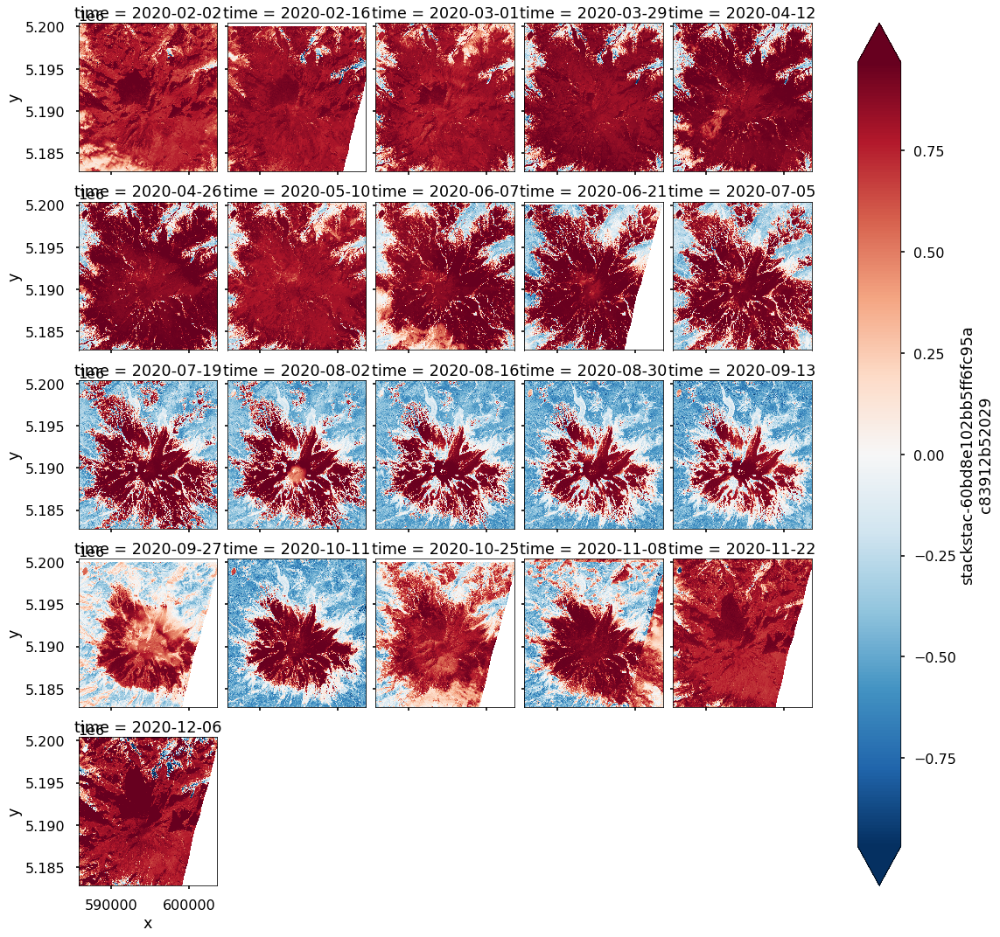

In [40]:
frames_ndsi.plot.imshow(col="time", col_wrap = 5, robust=True);

In [41]:
if shapefile_clip == True:
    rainier_glaciers = rainier_glaciers.to_crs(stack.crs)
    frames_ndsi_nis = frames_ndsi.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Nisqually Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False)
    frames_ndsi_emm = frames_ndsi.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Emmons Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False) 
    frames_ndsi_car = frames_ndsi.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Carbon Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False) 
    frames_ndsi_tah = frames_ndsi.rio.clip(rainier_glaciers[rainier_glaciers['Name'] == 'Tahoma Glacier WA'].geometry,rainier_glaciers.crs,drop=True,invert=False) 
    frames_ndsi_named = frames_ndsi.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)

Text(0.5, 1.0, 'Mean Backscatter, Senintel 2 NDSI, and SNOTEL SWE \nfor (2020-01-01, 2020-12-31)')

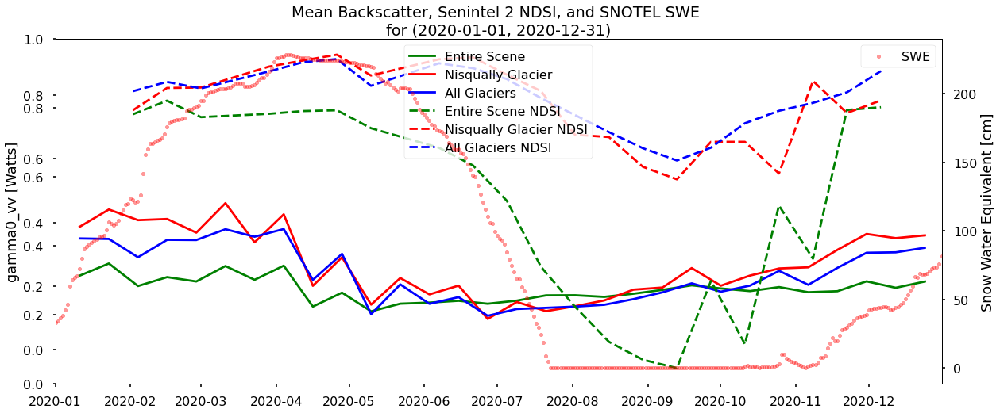

In [42]:
# look for local min for melt timings
f,ax = plt.subplots(figsize=(20,8))

ax.plot(frames.time,frames.mean(dim=['x','y']),'-g',label='Entire Scene')
ax.plot(frames_nis.time,frames_nis.mean(dim=['x','y']),'-r',label='Nisqually Glacier')
#ax.plot(frames_emm.time,frames_emm.mean(dim=['x','y']),label='Emmons Glacier')
#ax.plot(frames_car.time,frames_car.mean(dim=['x','y']),label='Carbon Glacier')
#ax.plot(frames_tah.time,frames_tah.mean(dim=['x','y']),label='Tahoma Glacier')
ax.plot(frames_named.time,frames_named.mean(dim=['x','y']),'-b',label='All Glaciers')

ax2=ax.twinx()
ax.plot(frames_ndsi.time,frames_ndsi.mean(dim=['x','y']),'--g',label='Entire Scene NDSI')
ax.plot(frames_ndsi_nis.time,frames_ndsi_nis.mean(dim=['x','y']),'--r',label='Nisqually Glacier NDSI')
#ax.plot(frames_ndsi_emm.time,frames_ndsi_emm.mean(dim=['x','y']),label='Emmons Glacier')
#ax.plot(frames_ndsi_car.time,frames_ndsi_car.mean(dim=['x','y']),label='Carbon Glacier')
#ax.plot(frames_ndsi_tah.time,frames_ndsi_tah.mean(dim=['x','y']),label='Tahoma Glacier')
ax.plot(frames_ndsi_named.time,frames_ndsi_named.mean(dim=['x','y']),'--b',label='All Glaciers NDSI')



ax3=ax2.twinx()
snotel_1_df.plot.scatter(x='date_time_utc',y='value',ax=ax3,c='r',alpha=0.4,label='SWE')

#values_precip_df.plot.scatter(x='date_time_utc',y='value',ax=ax3,c='b',alpha=0.8,label='Temperature')

ax.set_xlim([time_slice.start,time_slice.stop])
ax.legend(loc='upper center')
ax3.legend(loc='upper right')
ax3.grid(False)
ax3.set_ylabel('Snow Water Equivalent [cm]')
ax.set_ylabel('gamma0_vv [Watts]')

ax.set_title(f'Mean Backscatter, Senintel 2 NDSI, and SNOTEL SWE \nfor ({time_slice.start}, {time_slice.stop})')

In [43]:
#scenes_reflec = lowcloud.sel(band=['B02','B03','B04','B05','B06','B07','B08','B09','B11','B12']).sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice).mean("band", keep_attrs=True)
scenes_reflec = lowcloud.sel(band=['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12']).sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice).mean("band", keep_attrs=True)

In [44]:
%%time
frames_reflec_all = scenes_reflec.compute()
frames_reflec = frames_reflec_all.dropna('time',how='all')

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


CPU times: user 18min 11s, sys: 2min 5s, total: 20min 16s
Wall time: 4min 30s


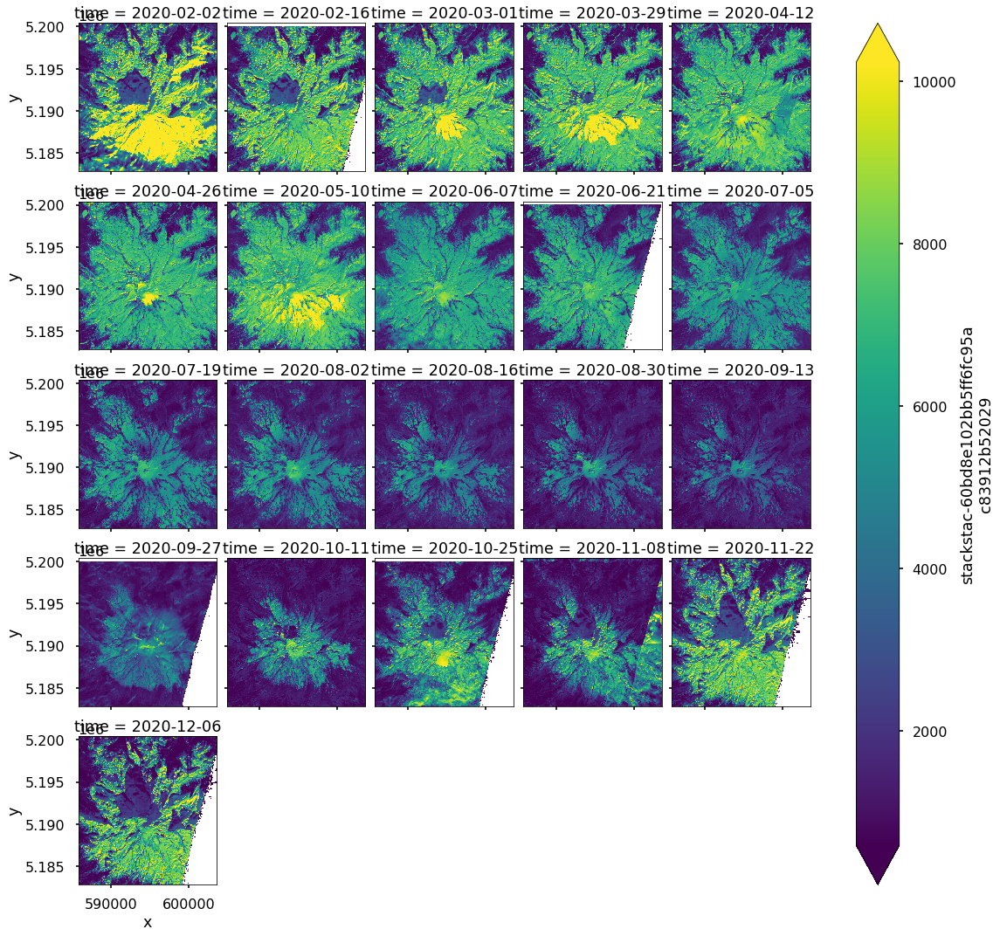

In [45]:
frames_reflec.plot.imshow(col="time", col_wrap = 5, robust=True);

In [46]:
frames_reflec_named = frames_reflec.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)

Text(0.5, 1.0, 'S1 Mean Backscatter, S2 NDSI, S2 Reflectance, and SNOTEL SWE \nfor (2020-01-01, 2020-12-31)')

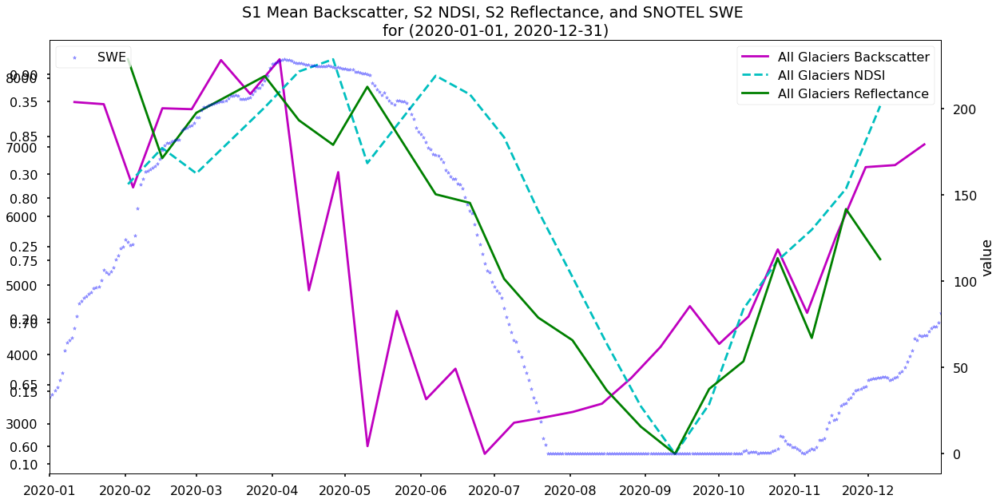

In [47]:
f,ax=plt.subplots(figsize=(20,10))

line_backscatter = ax.plot(frames_named.time,frames_named.mean(dim=['x','y']),'-m',label='All Glaciers Backscatter')

ax2=ax.twinx()
line_ndsi = ax2.plot(frames_ndsi_named.time,frames_ndsi_named.mean(dim=['x','y']),'--c',label='All Glaciers NDSI')

ax3=ax2.twinx()
line_reflec = ax3.plot(frames_reflec_named.time,frames_reflec_named.mean(dim=['x','y']),'-g',label='All Glaciers Reflectance')

ax4=ax3.twinx()
line_snotel = snotel_1_df.plot.scatter(x='date_time_utc',y='value',ax=ax4,c='b',marker='*',alpha=0.4,label='SWE')
ax4.set_xlim([time_slice.start,time_slice.stop])
ax4.legend(loc=2)
lns = line_backscatter+line_ndsi+line_reflec
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

ax.set_title(f'S1 Mean Backscatter, S2 NDSI, S2 Reflectance, and SNOTEL SWE \nfor ({time_slice.start}, {time_slice.stop})')

<AxesSubplot:xlabel='date_time_utc', ylabel='value'>

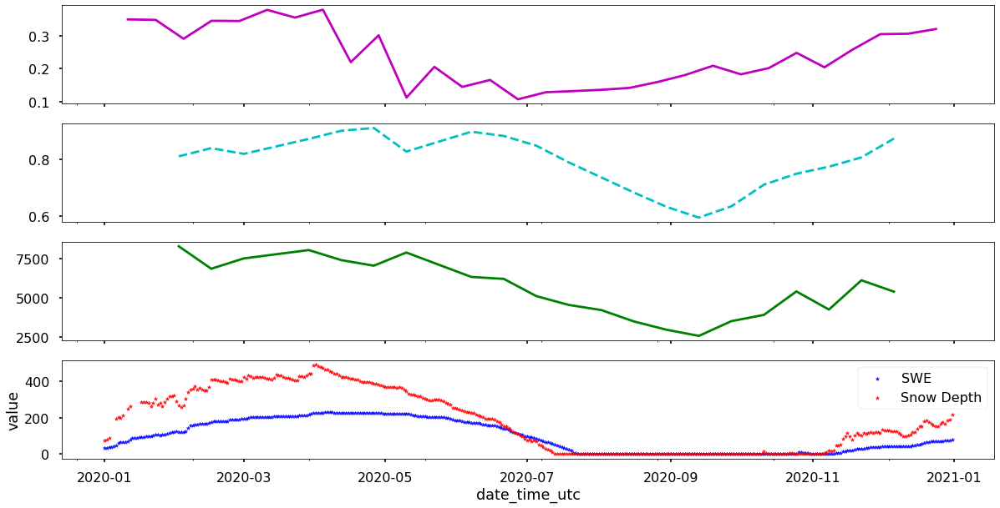

In [48]:
f,ax=plt.subplots(4,1,figsize=(20,10),sharex=True)
ax[0].plot(frames_named.time,frames_named.mean(dim=['x','y']),'-m',label='All Glaciers Backscatter')
ax[1].plot(frames_ndsi_named.time,frames_ndsi_named.mean(dim=['x','y']),'--c',label='All Glaciers NDSI')
ax[2].plot(frames_reflec_named.time,frames_reflec_named.mean(dim=['x','y']),'-g',label='All Glaciers Reflectance')
snotel_1_df.plot.scatter(x='date_time_utc',y='value',ax=ax[3],c='b',marker='*',alpha=0.9,label='SWE')
snotel_2_df.plot.scatter(x='date_time_utc',y='value',ax=ax[3],c='r',marker='*',alpha=0.9,label='Snow Depth')

In [49]:
nir, red, = lowcloud.sel(band="B08"), lowcloud.sel(band="B04")
ndvi = (nir-red)/(nir+red)

In [50]:
%%time
time_slice_ndvi = slice('2020-07-30','2020-09-09')
scenes_ndvi = ndvi.sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice_ndvi).mean("time", keep_attrs=True)
frames_ndvi_all = scenes_ndvi.compute()

CPU times: user 1min 20s, sys: 6.05 s, total: 1min 26s
Wall time: 53.6 s


In [51]:
frames_ndvi_all.values

array([[0.85194057, 0.85056406, 0.84872799, ..., 0.77201445, 0.62403421,
        0.68219083],
       [0.86133354, 0.8504887 , 0.84941285, ..., 0.83651044, 0.81767487,
        0.79855408],
       [0.86424338, 0.84712955, 0.85342417, ..., 0.83914115, 0.8491428 ,
        0.83542809],
       ...,
       [0.88559523, 0.87448092, 0.87949005, ..., 0.87123583, 0.86338851,
        0.84410924],
       [0.87335939, 0.87439301, 0.87588552, ..., 0.84898818, 0.86686516,
        0.86558988],
       [0.87883767, 0.88425514, 0.88143604, ..., 0.84249561, 0.85628414,
        0.86984011]])

In [52]:
frames_ndvi_all = frames_ndvi_all.rio.reproject_match(frames)

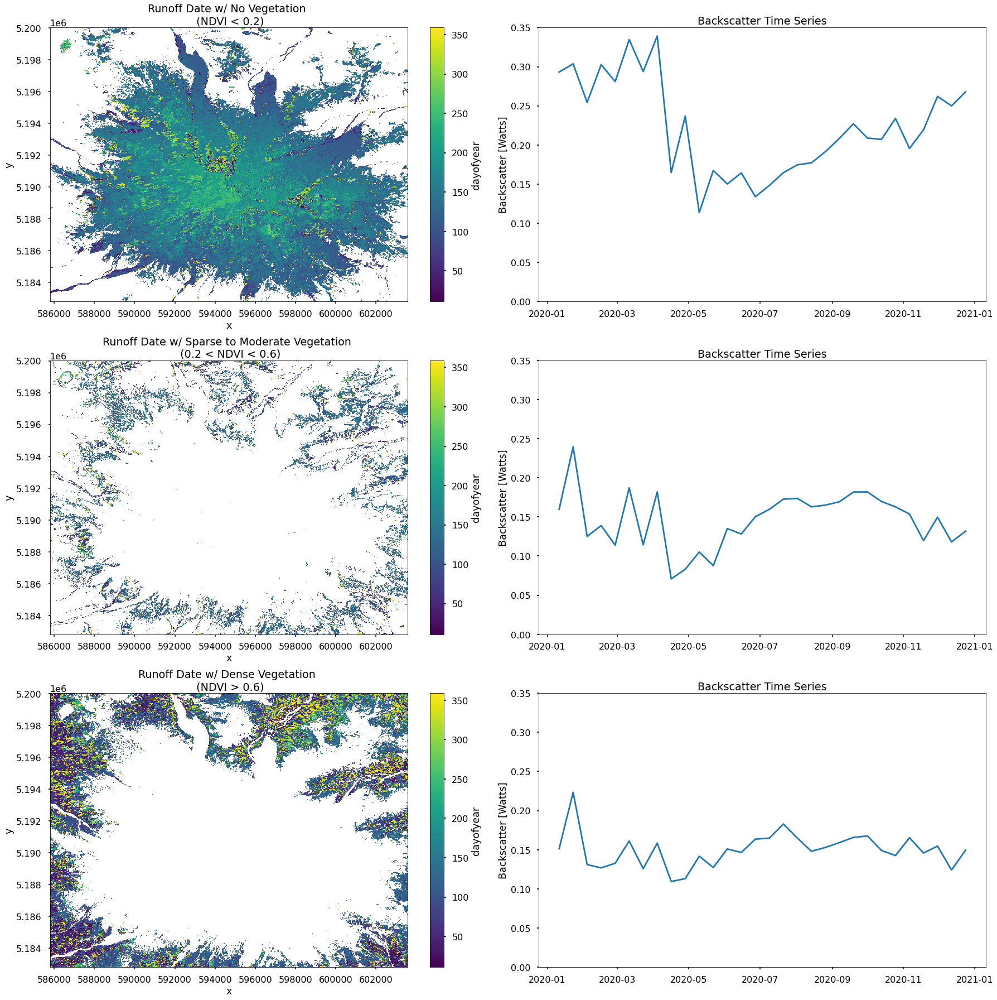

In [53]:
f,ax=plt.subplots(3,2,figsize=(25,25))
frames[mins_info].time.dt.dayofyear.where(frames_ndvi_all.values<0.2).plot(ax=ax[0,0])
ax[0,0].set_title('Runoff Date w/ No Vegetation \n (NDVI < 0.2)')
frames[mins_info].time.dt.dayofyear.where(frames_ndvi_all.values>0.2).where(frames_ndvi_all.values<0.6).plot(ax=ax[1,0])
ax[1,0].set_title('Runoff Date w/ Sparse to Moderate Vegetation \n (0.2 < NDVI < 0.6)')
#frames[mins_info].time.dt.dayofyear.where(frames_ndvi_all.values>0.4).where(frames_ndvi_all.values<0.6).plot(ax=ax[2,0])
#ax[2,0].set_title('Runoff Date w/ Moderate Vegetation \n (0.4 < NDVI < 0.6)')
frames[mins_info].time.dt.dayofyear.where(frames_ndvi_all.values>0.6).plot(ax=ax[2,0])
ax[2,0].set_title('Runoff Date w/ Dense Vegetation \n (NDVI > 0.6)')

ax[0,1].plot(frames.where(frames_ndvi_all.values<0.2).time,frames.where(frames_ndvi_all.values<0.2).mean(dim=['x','y']))

ax[1,1].plot(frames.where(frames_ndvi_all.values>0.2).where(frames_ndvi_all.values<0.6).time,frames.where(frames_ndvi_all.values>0.2).where(frames_ndvi_all.values<0.6).mean(dim=['x','y']))

#ax[2,1].plot(frames.where(frames_ndvi_all.values>0.4).where(frames_ndvi_all.values<0.6).time,frames.where(frames_ndvi_all.values>0.4).where(frames_ndvi_all.values<0.6).mean(dim=['x','y']))

ax[2,1].plot(frames.where(frames_ndvi_all.values>0.6).time,frames.where(frames_ndvi_all.values>0.6).mean(dim=['x','y']))

ax[0,1].set_title('Backscatter Time Series')
ax[1,1].set_title('Backscatter Time Series')
ax[2,1].set_title('Backscatter Time Series')

ax[0,1].set_ylabel('Backscatter [Watts]')
ax[1,1].set_ylabel('Backscatter [Watts]')
ax[2,1].set_ylabel('Backscatter [Watts]')

ax[0,1].set_ylim([0,0.35])
ax[1,1].set_ylim([0,0.35])
ax[2,1].set_ylim([0,0.35])

plt.tight_layout()

In [54]:
# now plot time series means for all groups perhaps in a column to the right of each figure

In [55]:
import rioxarray as rxr

Text(0.5, 0.98, '2020 Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum) \n each row: 2 week backscatter means for a given elevation range')

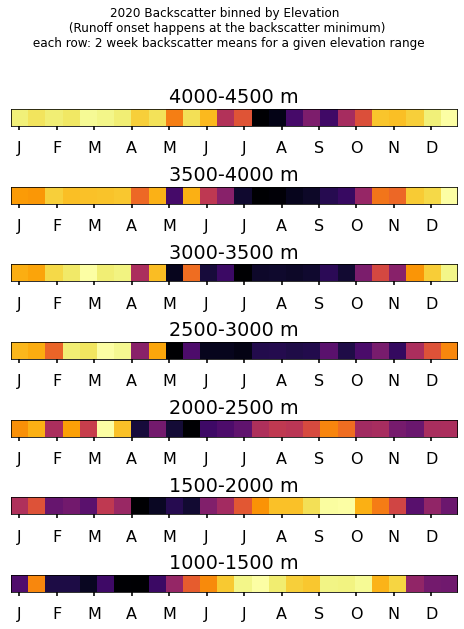

In [56]:
bin_size = 500
bin_centers = list(range(4250,1000,-500))

dem = rxr.open_rasterio('dem/dem_rainier_py3dep.tif',masked=True)
dem_projected = dem.rio.reproject_match(frames)
#dem_projected = dem_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False) 

frames_elev = frames.where(frames_ndvi_all.values<0.2).resample(time='2W').mean(dim='time')
month_labels = np.array(['J', 'F', 'M', 'A', 'M', 'J', 'J','A', 'S','O','N','D'])
#month_labels = np.array(['O','N','D','J', 'F', 'M', 'A', 'M', 'J', 'J','A', 'S'])

fig, ax = plt.subplots(len(bin_centers), figsize=(8,10))
fig.subplots_adjust(hspace=0,wspace=0)

for idx,bin_center in enumerate(bin_centers):
    frames_bin = frames_elev.where(np.abs(dem_projected - bin_center) < bin_size//2)
    backscatter_ts_for_bin = np.nanmean(frames_bin.data.reshape(frames_bin.shape[0],-1), axis=1) # (30,)
    i = idx
    ax[i].imshow(backscatter_ts_for_bin.reshape(1,-1),cmap='inferno') #cool_r
    ax[i].set_title(f"{bin_center-bin_size//2}-{bin_center+bin_size//2} m")
    ax[i].set_yticks([])
    ax[i].set_xticks([])
    ax[i].set_xticks(np.linspace(0,24,12), month_labels[0:12], rotation=0)
    if i == 25:
        ax[i].set_xlabel('week of the year')
fig.suptitle("2020 Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum) \n each row: 2 week backscatter means for a given elevation range")
#plt.tight_layout()


In [57]:
frames

<xarray.DataArray 'stackstac-95760c591cba9956c66157c7ac882381' (time: 30, y: 861, x: 889)>
array([[[0.06092138, 0.07842246, 0.10888778, ..., 0.14245178,
         0.14444616, 0.15678786],
        [0.06960836, 0.08434761, 0.10756292, ..., 0.14272152,
         0.15157174, 0.16821061],
        [0.09168366, 0.10077754, 0.11436325, ..., 0.13857241,
         0.14965294, 0.1751858 ],
        ...,
        [0.133102  , 0.14000052, 0.14343636, ..., 0.13619123,
         0.08741901, 0.08548959],
        [0.13985892, 0.15638548, 0.16881832, ..., 0.11032844,
         0.08143949, 0.08085477],
        [0.1346154 , 0.15282935, 0.16619849, ..., 0.10198613,
         0.09002755, 0.09300289]],

       [[0.12292084, 0.13406159, 0.14815691, ..., 0.16547564,
         0.16222988, 0.18635063],
        [0.11115985, 0.11928032, 0.13363183, ..., 0.17162842,
         0.1880643 , 0.25015962],
        [0.09182425, 0.09374177, 0.10866652, ..., 0.2032393 ,
         0.23855981, 0.31064746],
...
        [0.09947052, 0.09827235, 0.08813787, ..., 0.14554083,
         0.11929655, 0.08555809],
        [0.09628317, 0.09948327, 0.09868646, ..., 0.12698808,
         0.09082607, 0.06704047],
        [0.10268524, 0.10808401, 0.1175536 , ..., 0.11921594,
         0.08330268, 0.08064944]],

       [[0.05336327, 0.06090354, 0.10302839, ..., 0.22223382,
         0.22242466, 0.22393374],
        [0.0632269 , 0.06630295, 0.09277037, ..., 0.19427632,
         0.21205023, 0.24649338],
        [0.08078043, 0.07348134, 0.0876061 , ..., 0.16672802,
         0.18869892, 0.2428008 ],
        ...,
        [0.13954163, 0.13883683, 0.12944482, ..., 0.18600461,
         0.15541163, 0.11399283],
        [0.13395551, 0.13318409, 0.12150447, ..., 0.16026609,
         0.13876086, 0.10855076],
        [0.14482214, 0.15025683, 0.14838594, ..., 0.14490004,
         0.13828194, 0.12152594]]], dtype=float32)
Coordinates:
  * time                         (time) datetime64[ns] 2020-01-11T02:01:19 .....
    id                           (time) <U22 'S1B_20200111_10TES_ASC' ... 'S1...
    band                         <U9 'gamma0_vv'
  * x                            (x) float64 5.858e+05 5.858e+05 ... 6.036e+05
  * y                            (y) float64 5.2e+06 5.2e+06 ... 5.183e+06
    sentinel:product_ids         (time) object ['S1B_IW_GRDH_1SDV_20200111T02...
    sar:frequency_band           <U1 'C'
    gsd                          int64 20
    constellation                <U10 'sentinel-1'
    sar:center_frequency         float64 5.405
    platform                     (time) <U11 'sentinel-1b' ... 'sentinel-1b'
    sar:instrument_mode          <U2 'IW'
    sar:pixel_spacing_azimuth    int64 10
    sat:absolute_orbit           (time) int64 19763 19938 20113 ... 24663 24838
    created                      (time) <U27 '2021-11-29T19:17:40.149225Z' .....
    proj:transform               object {0.0, 1.0, -20.0, 499980.0, 5200020.0...
    sar:looks_equivalent_number  float64 4.3
    sat:relative_orbit           (time) int64 137 137 137 137 ... 137 137 137
    mgrs:grid_square             <U2 'ES'
    sar:observation_direction    <U5 'right'
    sar:resolution_range         float64 20.3
    sar:looks_azimuth            int64 1
    instruments                  <U5 'c-sar'
    start_datetime               (time) <U20 '2020-01-11T02:00:55Z' ... '2020...
    mgrs:utm_zone                <U2 '10'
    mgrs:latitude_band           <U1 'T'
    sar:polarizations            object {'VV', 'VH'}
    sentinel:mgrs                <U5 '10TES'
    proj:shape                   object {5490}
    sat:orbit_state              (time) <U10 'ascending' ... 'ascending'
    sar:product_type             <U3 'RTC'
    end_datetime                 (time) <U20 '2020-01-11T02:01:44Z' ... '2020...
    sar:looks_range              int64 5
    proj:epsg                    int64 32610
    sar:resolution_azimuth       float64 22.6
    sar:pixel_spacing_range      int64 10
    title                        <U21 'Gamma0 VV backscatter'
   

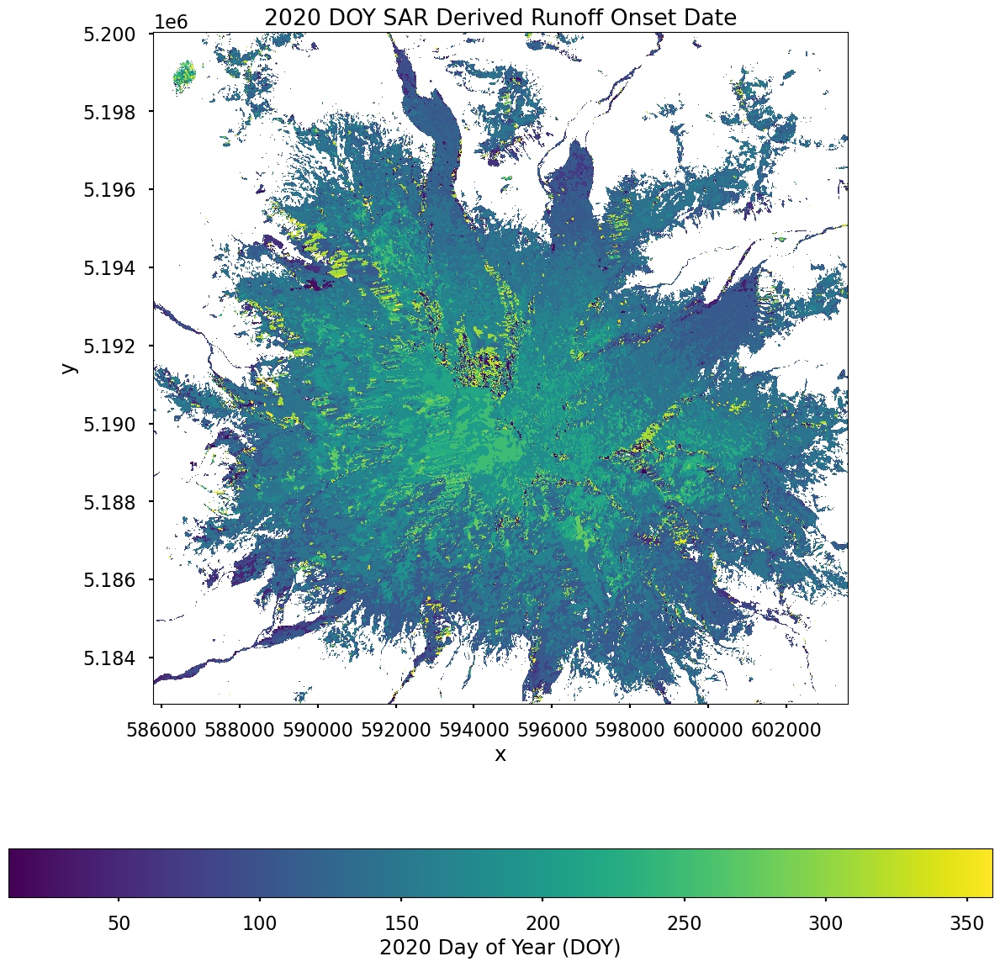

In [84]:
f,ax=plt.subplots(figsize=(12,12))
plt.style.use('seaborn-poster')
color = frames[mins_info].time.dt.dayofyear.where(frames_ndvi_all.values<0.2).plot(add_colorbar=False)
ax.set_title('2020 DOY SAR Derived Runoff Onset Date')
cbar = f.colorbar(color,orientation='horizontal')
cbar.set_label('2020 Day of Year (DOY)')
ax.set_aspect('equal')
plt.tight_layout()


In [59]:
frames_ndsi = frames_ndsi.rio.reproject_match(frames)
frames_reflec = frames_reflec.rio.reproject_match(frames)

In [60]:
plt.rcParams.update(plt.rcParamsDefault)

In [61]:
plt.style.use('seaborn-poster')

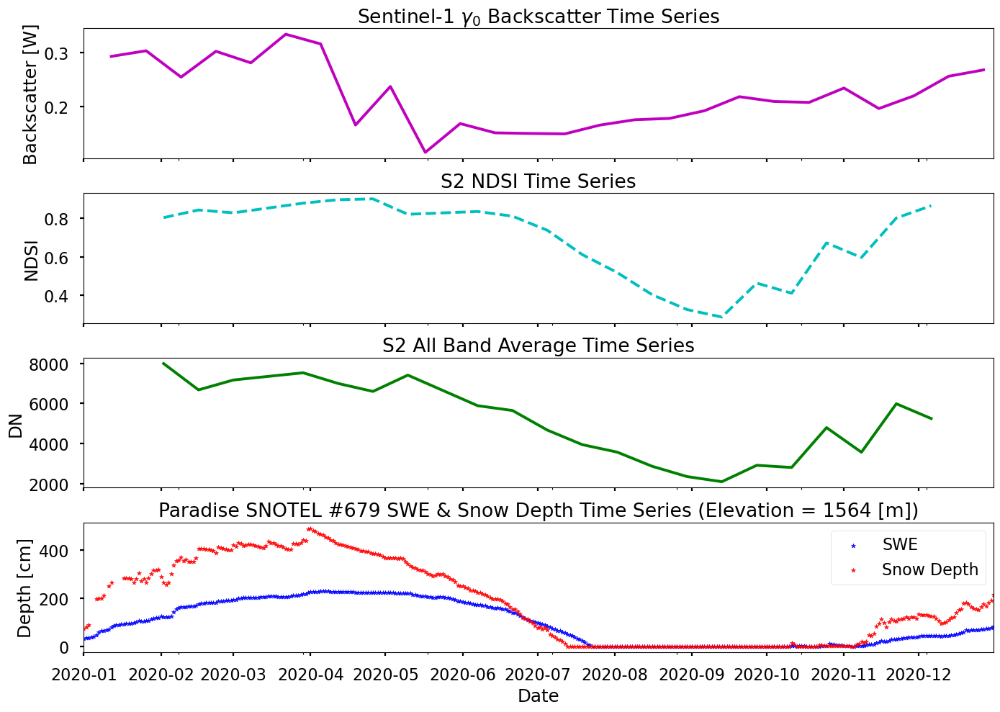

In [62]:
plt.style.use('seaborn-poster')
f,ax=plt.subplots(4,1,figsize=(14,10),sharex=True)
plt.style.use('seaborn-poster')
ax[0].plot(frames.where(frames_ndvi_all.values<0.2).resample(time='2W').mean(dim='time').time,frames.where(frames_ndvi_all.values<0.2).resample(time='2W').mean(dim='time').mean(dim=['x','y']),'-m',label='Aackscatter')
ax[1].plot(frames_ndsi.where(frames_ndvi_all.values<0.2).time,frames_ndsi.where(frames_ndvi_all.values<0.2).mean(dim=['x','y']),'--c',label='NDSI')
ax[2].plot(frames_reflec.where(frames_ndvi_all.values<0.2).time,frames_reflec.where(frames_ndvi_all.values<0.2).mean(dim=['x','y']),'-g',label='S2 All Band Reflectance')
snotel_1_df.plot.scatter(x='date_time_utc',y='value',ax=ax[3],c='b',marker='*',alpha=0.9,label='SWE')
snotel_2_df.plot.scatter(x='date_time_utc',y='value',ax=ax[3],c='r',marker='*',alpha=0.9,label='Snow Depth')
ax[0].set_title('Sentinel-1 $\gamma_0$ Backscatter Time Series')
ax[0].set_ylabel('Backscatter [W]')

ax[1].set_title('S2 NDSI Time Series')
ax[1].set_ylabel('NDSI')

ax[2].set_title('S2 All Band Average Time Series')
ax[2].set_ylabel('DN')

ax[3].set_title('Paradise SNOTEL #679 SWE & Snow Depth Time Series (Elevation = 1564 [m])')
ax[3].set_ylabel('Depth [cm]')
ax[3].set_xlabel('Date')
plt.tight_layout()

for axs in ax:
    axs.set_xlim([time_slice.start,time_slice.stop])

In [63]:
# elevation bins

In [64]:
# %%time
# rgb = lowcloud.sel(band=["B04","B03","B02"])
# time_slice = slice('2020-06-01','2020-09-01') # All of 2020
# scenes_rgb = rgb.sel(x=slice(xmin,xmax),y=slice(ymin,ymax-0.0025E6)).sel(time=time_slice)
# frames_rgb_all = scenes_rgb.compute()
# frames_rgb = frames_rgb_all.dropna('time',how='all')

In [65]:
# frames_rgb.plot.imshow(col='time')

In [66]:
#frames_rgb = frames_rgb.isel(time=0).rio.reproject_match(frames)

In [67]:
# b4 = frames_rgb.isel(time=0).sel(band='B04').squeeze()/frames_rgb.isel(time=0).sel(band='B04').max()

In [68]:
# b3 = frames_rgb.isel(time=0).sel(band='B03').squeeze()/frames_rgb.isel(time=0).sel(band='B03').max()

In [69]:
# b2 = frames_rgb.isel(time=0).sel(band='B02').squeeze()/frames_rgb.isel(time=0).sel(band='B02').max()

In [70]:
# def channelnorm(im, channel, vmin, vmax):
#     c = (im[:,:,channel]-vmin) / (vmax-vmin)
#     c[c<0.] = 0
#     c[c>1.] = 1
#     im[:,:,channel] = c
#     return im

In [71]:
# st = np.dstack([b4,b3,b2])

In [72]:
# vmin = 0.0
# vmax = 0.6
# st = channelnorm(st,0,vmin,vmax)
# st = channelnorm(st,1,vmin,vmax)
# st = channelnorm(st,2,vmin,vmax)

In [73]:
# st

In [74]:
#st

In [75]:
# plt.style.use('fast')
# plt.style.use('default')


In [76]:
#frames_rgb['B04']= frames_rgb.sel(band='B04')/frames_rgb.sel(band='B04').max()

In [77]:
# f,ax=plt.subplots(figsize=(10,10))
# plt.style.use('default')
# #frames.isel(time=0).plot(ax=ax,cmap='gray',vmin=0,vmax=0.4)
# #ax.imshow(frames_rgb.isel(time=0).sel(band='B04'))
# ax.imshow(st,extent=[xmin,xmax,ymax-0.0025E6,ymin])

# nis = rainier_glaciers[rainier_glaciers['Name'] == 'Nisqually Glacier WA']
# emm = rainier_glaciers[rainier_glaciers['Name'] == 'Emmons Glacier WA']
# car = rainier_glaciers[rainier_glaciers['Name'] == 'Carbon Glacier WA']
# tah = rainier_glaciers[rainier_glaciers['Name'] == 'Tahoma Glacier WA']
# gn = nis.geometry.plot(ax=ax,alpha=1,linewidth=4,facecolor='none',edgecolor='r',label='Nisqually Glacier')
# ge = emm.geometry.plot(ax=ax,alpha=1,linewidth=4,facecolor='none',edgecolor='m',label='Emmons Glacier')
# gc = car.geometry.plot(ax=ax,alpha=1,linewidth=4,facecolor='none',edgecolor='c',label='Carbon Glacier')
# gt = tah.geometry.plot(ax=ax,alpha=1,linewidth=4,facecolor='none',edgecolor='g',label='Tahoma Glacier')
# #ax.set_label(['a','b','c','d'])
# #snotel_utm.plot(ax=ax)
# sn = ax.scatter(snotel_utm.iloc[0].geometry.x,snotel_utm.iloc[0].geometry.y,c='b',s=800,marker='*')
# ax.set_aspect('equal')
# ax.grid(False)
# ax.set_xlabel('x')
# ax.set_ylabel('y')

# plt.legend(handles=[gn,ge,gc,gt])
# plt.tight_layout()

In [78]:
#ymax-0.0025E6